# Cellbender testing - Merging

<div class="alert alert-warning">

**What the fourth section (Merging) does**
    
This section merges the different datasets and visualizes the merged data. The section contains the following important subsections:

* Merging <br>
* Alignment parameter visualization <br>
</div>  


### Loading libraries
Using sc2_seurat environment

In [1]:
import sys
print(sys.executable)
print(sys.version)
print(sys.version_info)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/bin/python
3.9.9 | packaged by conda-forge | (main, Dec 20 2021, 02:40:17) 
[GCC 9.4.0]
sys.version_info(major=3, minor=9, micro=9, releaselevel='final', serial=0)


In [2]:
from IPython.display import display, HTML
display(HTML("<style>.container { width:90% !important; }</style>"))#embed HTML within IPython notebook and make containers 90% of screen
import numpy as np
import pandas as pd
import anndata as ad
import scanpy as sc
import seaborn as sns
import os
import matplotlib.pyplot as plt

%matplotlib inline
sc.settings.verbosity = 0             # verbosity: errors (0), warnings (1), info (2), hints (3)
sc.settings.set_figure_params(dpi=80, facecolor='white') #figure resolution and background color

# This is used
# os.path.join('data/'+object_names[i][6:10]+'_preprocessed.h5ad')
#sc.logging.print_versions()

## Load data
The filtered .h5ad  files from preprocessing section.

In [3]:
#siletti
siletti_reg='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_f1_reg_processed_1.h5ad'
siletti_CB_reg='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_CB_f1_reg_processed_1.h5ad'

#altena
altena_reg='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_f1_reg_processed_1.h5ad'
altena_CB_reg='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_CB_f1_reg_processed_1.h5ad'


# Not regularized
#siletti
siletti='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_f1_processed_1.h5ad'
siletti_CB='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/siletti_CB_f1_processed_1.h5ad'

#altena
altena='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_f1_processed_1.h5ad'
altena_CB='/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender/data/altena_CB_f1_processed_1.h5ad'

In [4]:
#set data path
os.chdir('/home/hers_basak/jjiang/jack/outputs/deliverables/0_cellbender')

In [5]:
os.getcwd()

'/hpc/hers_basak/rnaseq_data/Basaklab/jjiang/outputs/deliverables/0_cellbender'

In [6]:
!ls data/

altena_CB_f1_processed_1.h5ad	   siletti_CB_f1_processed_1.h5ad
altena_CB_f1_reg_processed_1.h5ad  siletti_CB_f1_reg_processed_1.h5ad
altena_CB_filtered_1.h5ad	   siletti_CB_filtered_1.h5ad
altena_CB_preprocessed.h5ad	   siletti_CB_preprocessed.h5ad
altena_f1_processed_1.h5ad	   siletti_f1_processed_1.h5ad
altena_f1_reg_processed_1.h5ad	   siletti_f1_reg_processed_1.h5ad
altena_filtered_1.h5ad		   siletti_filtered_1.h5ad
altena_preprocessed.h5ad	   siletti_preprocessed.h5ad


In [7]:
files = [siletti_reg, siletti_CB_reg, altena_reg, altena_CB_reg]
files_no_reg=[siletti, siletti_CB, altena, altena_CB]

In [8]:
names = [name.split('_reg_processed')[0].split('/data/')[1] for name in files ]
print(names)

['siletti_f1', 'siletti_CB_f1', 'altena_f1', 'altena_CB_f1']


In [9]:
object_names_processed=list()
numberobj = len(files)

for i in range(numberobj):
    object_names_processed.append("adata"+"_"+names[i]+"_reg_"+"processed")
    locals()[object_names_processed[i]] = sc.read(files[i]) 
    print(object_names_processed[i],' is loaded')

adata_siletti_f1_reg_processed  is loaded
adata_siletti_CB_f1_reg_processed  is loaded
adata_altena_f1_reg_processed  is loaded
adata_altena_CB_f1_reg_processed  is loaded


In [10]:
object_names_processed_no_reg=list()
numberobj = len(files_no_reg)

for i in range(numberobj):
    object_names_processed_no_reg.append("adata"+"_"+names[i]+"_processed")
    locals()[object_names_processed_no_reg[i]] = sc.read(files_no_reg[i]) 
    print(object_names_processed_no_reg[i],' is loaded')

adata_siletti_f1_processed  is loaded
adata_siletti_CB_f1_processed  is loaded
adata_altena_f1_processed  is loaded
adata_altena_CB_f1_processed  is loaded


In [11]:
for i in range(numberobj):
    locals()[object_names_processed[i]].obs['cellbender'] = ['False','True','False','True'][i]
    locals()[object_names_processed_no_reg[i]].obs['cellbender'] = ['False','True','False','True'][i]

In [12]:
#To make reproducible plots
np.random.seed(41)

# Concatenating 

## Siletti only

In [30]:
adata_merge_siletti = ad.concat([adata_siletti_f1_reg_processed, adata_siletti_CB_f1_reg_processed],  join="outer", fill_value=0)

merged_adata = adata_merge_siletti


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


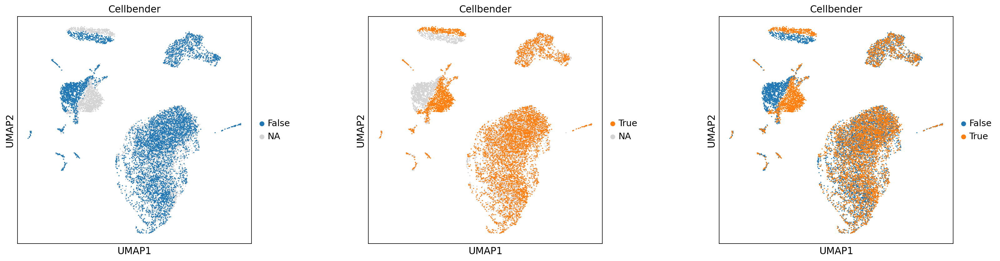

In [35]:
feature= 'cellbender'
group1= 'False'
group2= 'True'
title='Cellbender'

fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title=title)
fig.savefig('figures/merge/merge_siletti_subplots.png',bbox_inches='tight')

No reg

In [13]:
adata_merge_siletti = ad.concat([adata_siletti_f1_processed, adata_siletti_CB_f1_processed],  join="outer", fill_value=0)

merged_adata = adata_merge_siletti


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)



/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")
/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


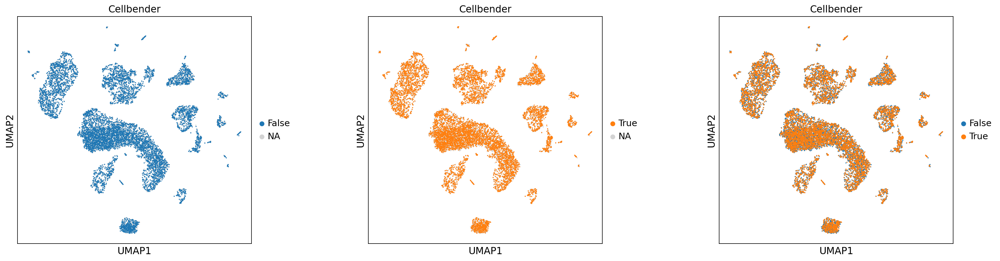

In [14]:
feature= 'cellbender'
group1= 'False'
group2= 'True'
title='Cellbender'

fig, axs = plt.subplots(1, 3, figsize = [24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title=title)
fig.savefig('figures/merge/merge_siletti_no_reg_subplots.png',bbox_inches='tight')

## altena

In [33]:
adata_merge_altena = ad.concat([adata_altena_f1_reg_processed,
adata_altena_CB_f1_reg_processed ],  join="outer", fill_value=0)

merged_adata = adata_merge_altena


merged_adata.obs_names_make_unique()

sc.tl.pca(merged_adata, svd_solver='arpack')

nn= 15 #default 15
sc.pp.neighbors(merged_adata, n_neighbors=nn, n_pcs=40) # causes well mix between reference genomes
sc.tl.umap(merged_adata)


/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


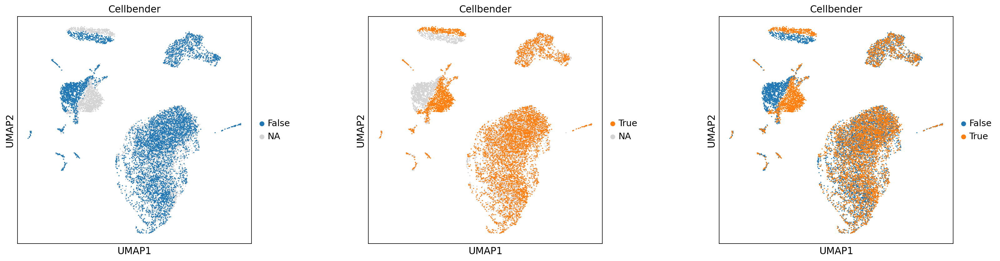

In [34]:
feature= 'cellbender'
group1= 'False'
group2= 'True'
title = 'Cellbender'
fig, axs = plt.subplots(1, 3, figsize =[24,6])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.5)
sc.pl.umap(merged_adata, color=feature, groups= group1, use_raw=False, s=10, ax= axs[0],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1],show=False, title=title)
sc.pl.umap(merged_adata, color=feature, use_raw=False, s=10, ax= axs[2],show=False, title=title)
fig.savefig('figures/merge/merge_altena_subplots.png',bbox_inches='tight')

## All data

In [12]:
adata_merge = ad.concat([adata_siletti_f1_reg_processed, adata_siletti_CB_f1_reg_processed ,adata_altena_f1_reg_processed, adata_altena_CB_f1_reg_processed],  join="outer", fill_value=0)
adata_merge.obs_names_make_unique()

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/anndata/_core/anndata.py:1830: UserWarning: Observation names are not unique. To make them unique, call `.obs_names_make_unique`.
  utils.warn_names_duplicates("obs")


pca again

In [37]:
sc.tl.pca(adata_merge, svd_solver='arpack')
#    sc.tl.pca(locals()[object_names_reg[i]], svd_solver='arpack')

In [38]:
nn= 15 #default 15
sc.pp.neighbors(adata_merge, n_neighbors=nn, n_pcs=40)
sc.tl.umap(adata_merge)

/hpc/hers_basak/bin/miniconda3/envs/sc2_seurat/lib/python3.9/site-packages/sklearn/manifold/_spectral_embedding.py:260: UserWarning: Graph is not fully connected, spectral embedding may not work as expected.
  warnings.warn(


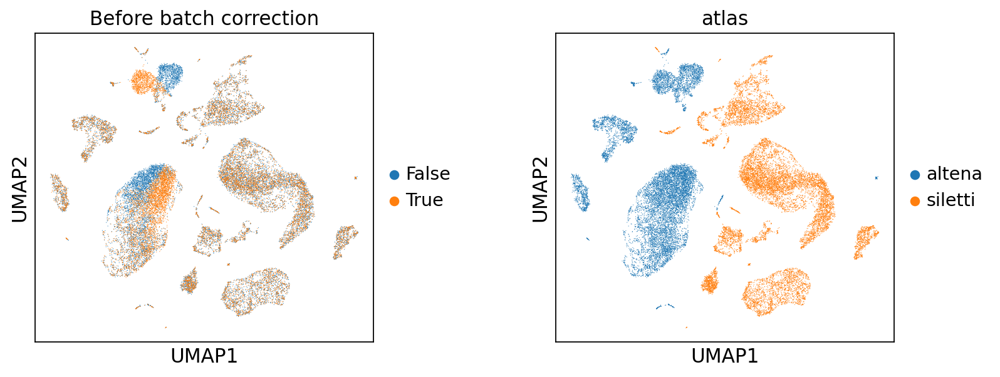

In [40]:
sc.pl.umap(adata_merge,color=['cellbender', 'atlas'], wspace=0.4,s=1, title='Before batch correction')

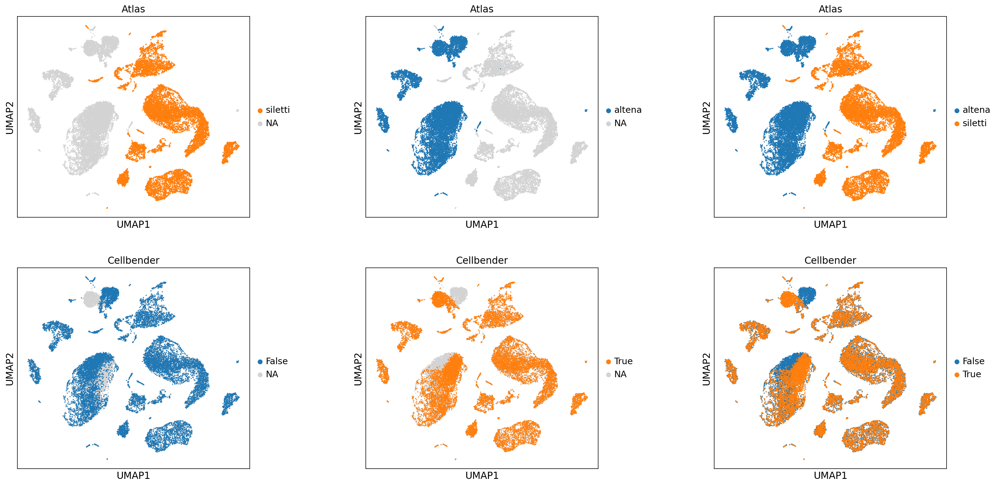

In [41]:
fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')

feature= 'cellbender'
group1= 'False'
group2= 'True'
title = 'Cellbender'

fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge, color=feature, groups= group1, use_raw=False, s=10, ax= axs[1,0],show=False, title=title)
sc.pl.umap(adata_merge, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1,1],show=False, title=title)
sc.pl.umap(adata_merge, color=feature, use_raw=False, s=10, ax= axs[1,2],show=False, title=title)
fig.savefig('figures/merge/merge_all_subplots.png',bbox_inches='tight')

In [42]:
adata_merge

AnnData object with n_obs × n_vars = 28041 × 10369
    obs: 'species', 'atlas', 'doublet_score', 'predicted_doublet', 'n_genes_by_counts', 'log1p_n_genes_by_counts', 'total_counts', 'log1p_total_counts', 'total_counts_mt', 'log1p_total_counts_mt', 'pct_counts_mt', 'total_counts_ribo', 'log1p_total_counts_ribo', 'pct_counts_ribo', 'n_genes', 'total_counts_mito', 'total_counts_norm', 'cellbender'
    uns: 'pca', 'neighbors', 'umap', 'cellbender_colors', 'atlas_colors'
    obsm: 'X_pca', 'X_umap'
    varm: 'PCs'
    obsp: 'distances', 'connectivities'

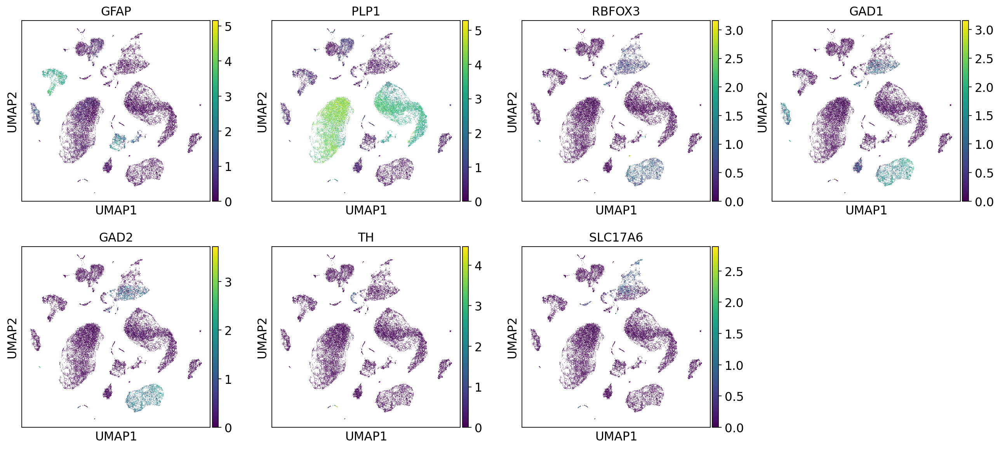

In [43]:

    if adata_merge.obs['species'][0] == 'Homo sapien':
        sc.pl.umap(adata_merge, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2', 'TH','SLC17A6'], use_raw=True, s=1)
           #,save = "merge_umap_n"+str(nn)+"_2.pdf")
    else:
        sc.pl.umap(adata_merge, color=['Gfap', 'Plp1', 'Rbfox3','Gad1','Gad2', 'Slc17a6','Th'],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Rbfox3(post-mitotic neurons)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'], use_raw=False, s=25
                  )#,save = "_merge_umap_n"+str(nn)+"_2.pdf")

# Batch Correction

In [13]:
adata_merge_rb = adata_merge.copy()

In [14]:
sc.tl.pca(adata_merge_rb, svd_solver='arpack')

In [15]:
sc.external.pp.harmony_integrate(adata_merge_rb, key =['atlas'])

2023-06-08 11:57:59,342 - harmonypy - INFO - Iteration 1 of 10
2023-06-08 11:58:21,027 - harmonypy - INFO - Iteration 2 of 10
2023-06-08 11:58:42,676 - harmonypy - INFO - Iteration 3 of 10
2023-06-08 11:59:04,791 - harmonypy - INFO - Iteration 4 of 10
2023-06-08 11:59:26,729 - harmonypy - INFO - Iteration 5 of 10
2023-06-08 11:59:43,859 - harmonypy - INFO - Iteration 6 of 10
2023-06-08 11:59:59,851 - harmonypy - INFO - Iteration 7 of 10
2023-06-08 12:00:13,047 - harmonypy - INFO - Iteration 8 of 10
2023-06-08 12:00:27,393 - harmonypy - INFO - Iteration 9 of 10
2023-06-08 12:00:39,860 - harmonypy - INFO - Iteration 10 of 10
2023-06-08 12:00:50,722 - harmonypy - INFO - Converged after 10 iterations


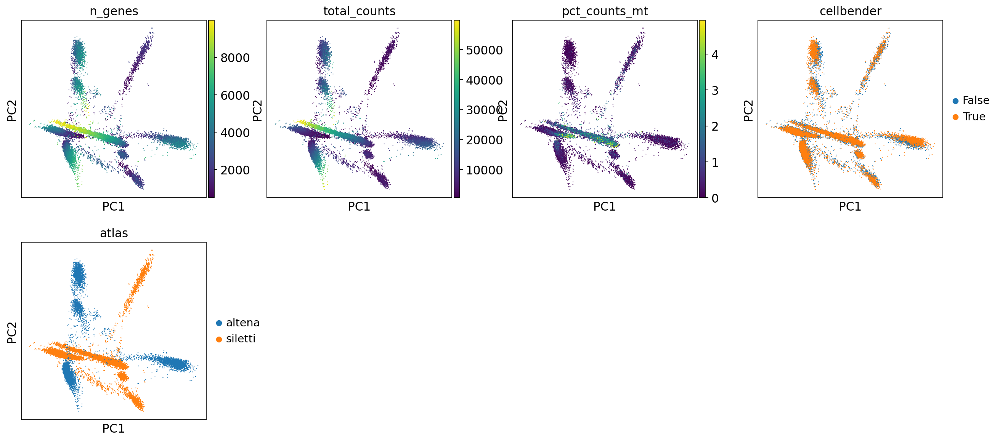

In [16]:
sc.pl.pca(adata_merge, color=['n_genes', 'total_counts', 'pct_counts_mt', 'cellbender', 'atlas'], save = "_merge_pca_1.pdf")
#    sc.pl.pca(locals()[object_names_reg[i]], color=['n_genes', 'total_counts', 'pct_counts_mt'], save = "_"+object_names_reg[i]+"_intron_metrics_1.pdf")


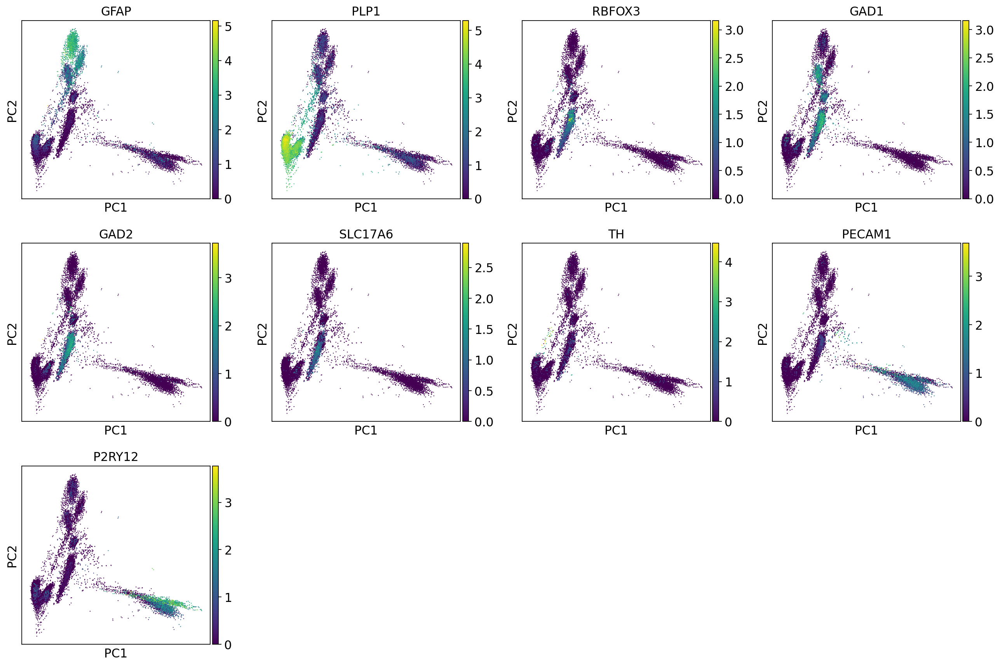

In [17]:
sc.pl.pca(adata_merge_rb, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','PECAM1','P2RY12' ])

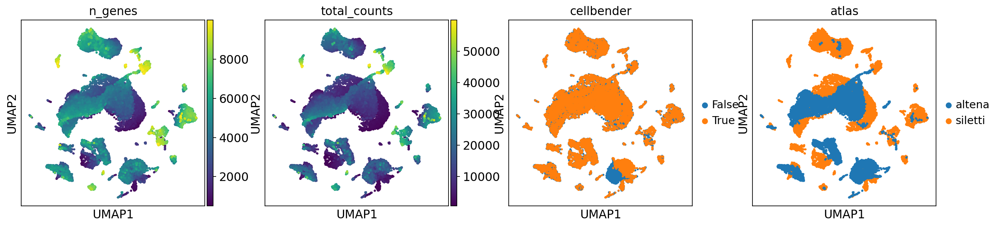

In [19]:
sc.pp.neighbors(adata_merge_rb, n_neighbors=15, n_pcs=40,use_rep='X_pca_harmony')
sc.tl.umap(adata_merge_rb)
sc.pl.umap(adata_merge_rb, color=['n_genes', 'total_counts','cellbender', 'atlas'], 
           use_raw=False, s=25,save = '_merge_batch_rb_1.pdf')

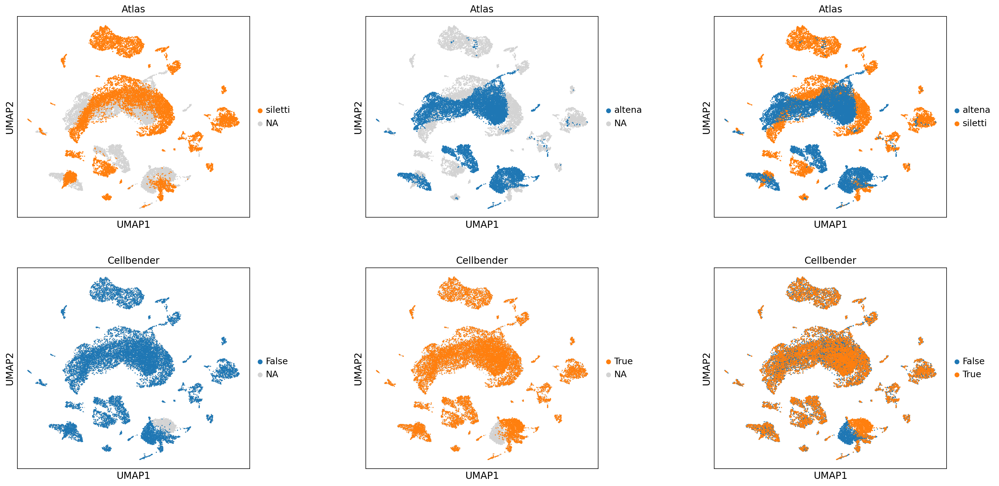

In [20]:
feature='cellbender'
group1='False'
group2='True'
title='Cellbender'

fig, axs = plt.subplots(2, 3, figsize = [24,12])
#axs[-1, -1].axis('off')

fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.5, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'siletti', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', groups= 'altena', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color='atlas', use_raw=False, s=10, ax= axs[0,2],show=False, title='Atlas')
sc.pl.umap(adata_merge_rb, color=feature, groups= group1, use_raw=False, s=10, ax= axs[1,0],show=False, title=title)
sc.pl.umap(adata_merge_rb, color=feature, groups= group2, use_raw=False, s=10, ax= axs[1,1],show=False, title=title)
sc.pl.umap(adata_merge_rb, color=feature, use_raw=False, s=10, ax= axs[1,2],show=False, title=title)
fig.savefig('figures/merge/merge_batch_rb_subplots.png',bbox_inches='tight')

In [21]:
atlas_ref = adata_merge_rb.obs['atlas'].astype(str)+ "_" + adata_merge_rb.obs['cellbender'].astype(str)
adata_merge_rb.obs['atlas_cellbender'] = atlas_ref

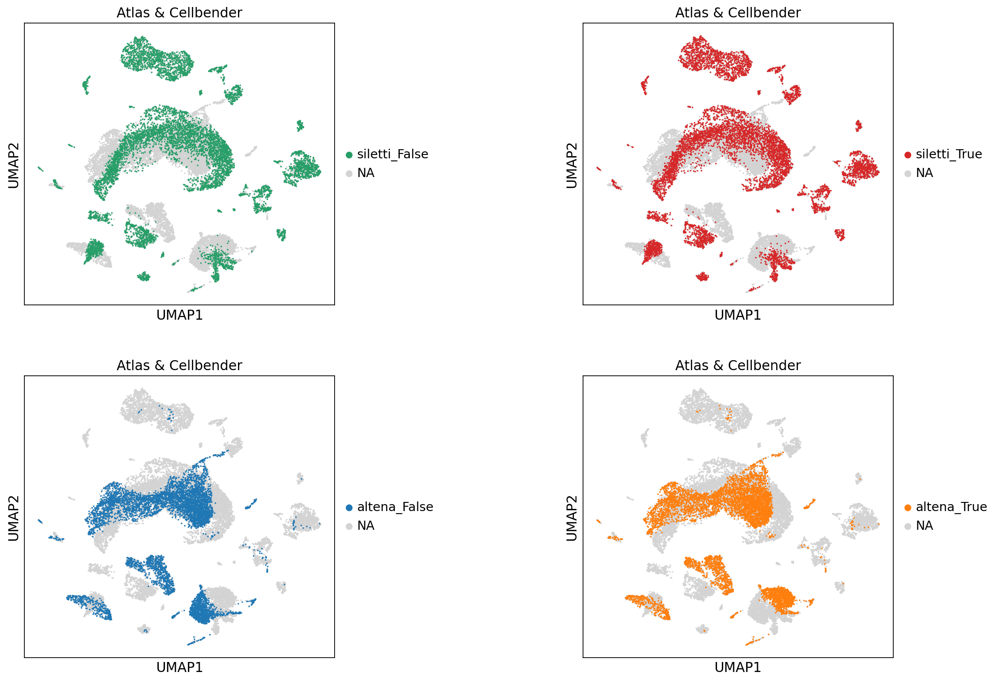

In [22]:
fig, axs = plt.subplots(2, 2, figsize = [16,12])
#axs[-1, -1].axis('off')
fig.subplots_adjust(left=None, bottom=None, right=None, top=None, wspace=0.8, hspace=0.25)
sc.pl.umap(adata_merge_rb, color='atlas_cellbender', groups= 'siletti_False', use_raw=False, s=10, ax= axs[0,0],show=False, title='Atlas & Cellbender')
sc.pl.umap(adata_merge_rb, color='atlas_cellbender', groups= 'siletti_True', use_raw=False, s=10, ax= axs[0,1],show=False, title='Atlas & Cellbender')
sc.pl.umap(adata_merge_rb, color='atlas_cellbender', groups= 'altena_False', use_raw=False, s=10, ax= axs[1,0],show=False, title='Atlas & Cellbender')
sc.pl.umap(adata_merge_rb, color='atlas_cellbender', groups= 'altena_True', use_raw=False, s=10, ax= axs[1,1],show=False, title='Atlas & Cellbender')
#sc.pl.umap(adata_merge_rb, color='atlas_ref', use_raw=False, s=25, ax= axs[0,2],show=False)
fig.savefig('figures/merge/merge_batch_rb_specific_subplots.png',bbox_inches='tight')

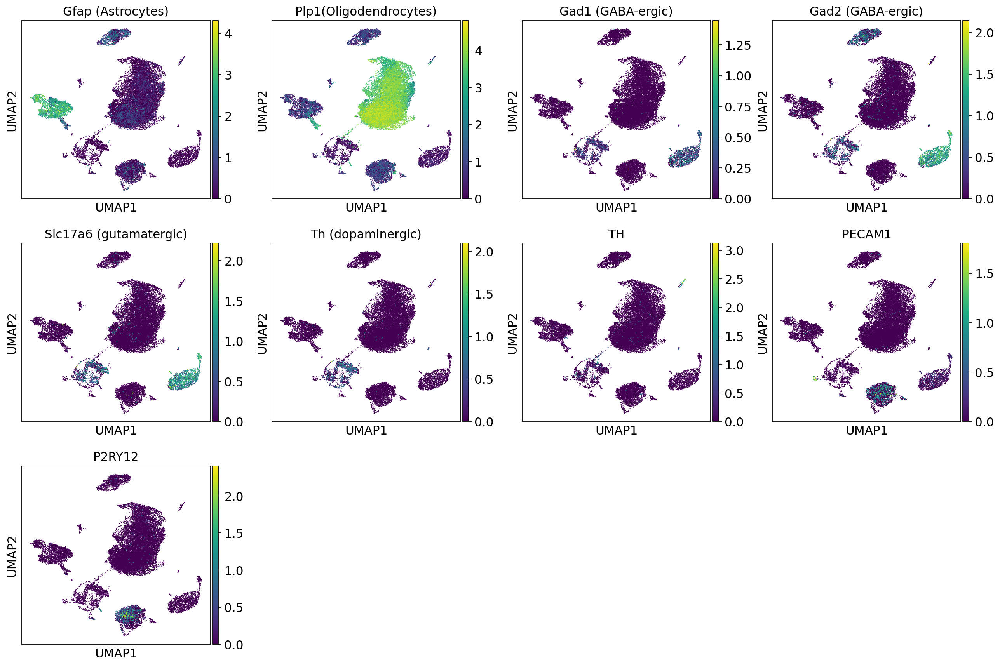

In [56]:
sc.pl.umap(adata_merge_rb, color=['GFAP', 'PLP1', 'RBFOX3','GAD1','GAD2','SLC17A6','TH','PECAM1','P2RY12' ],title=['Gfap (Astrocytes)', 'Plp1(Oligodendrocytes)', 'Gad1 (GABA-ergic)','Gad2 (GABA-ergic)', 'Slc17a6 (gutamatergic)', 'Th (dopaminergic)'],  s=3)
   #save = "_merge_umap_n"+str(nn)+"_2.pdf")